In [1]:
import os
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from keras.models import load_model
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
import pandas as pd
from PIL import Image
import shutil

In [2]:
# Set paths
base_dir = r"C:\Users\sanje\Downloads\Datamining.ipynb\archive (4)\plant_disease_data"
train_dir = os.path.join(base_dir, "Train")
val_dir = os.path.join(base_dir, "Validation")
test_dir = os.path.join(base_dir, "Test", "Test")  # based on your folder structure


In [3]:
# Image preprocessing
img_height, img_width = 256, 256
batch_size = 32

train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen   = ImageDataGenerator(rescale=1./255)
test_datagen  = ImageDataGenerator(rescale=1./255)

In [4]:
base_dir = r"C:\Users\sanje\Downloads\Datamining.ipynb\archive (4)\plant_disease_data\Test"


In [5]:
# List class folders
classes = [d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]
print("Classes:", classes)

Classes: ['Healthy', 'Powdery', 'Rust']


In [6]:
# Pick one class
sample_class = classes[0]

In [7]:
# Get sample image path
sample_class_dir = os.path.join(base_dir, sample_class)
sample_image_name = os.listdir(sample_class_dir)[0]
sample_image_path = os.path.join(sample_class_dir, sample_image_name)

print(f"Sample image path: {sample_image_path}")

Sample image path: C:\Users\sanje\Downloads\Datamining.ipynb\archive (4)\plant_disease_data\Test\Healthy\8ddaa5a5caa5caa8.jpg


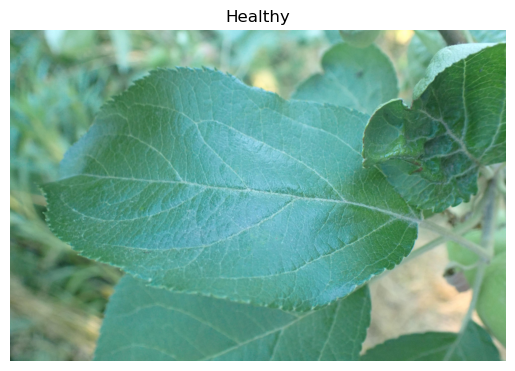

In [8]:
# Load and show image
img = Image.open(sample_image_path)
plt.imshow(img)
plt.title(sample_class)
plt.axis('off')
plt.show()

In [9]:
test_dir = r"C:\Users\sanje\Downloads\Datamining.ipynb\archive (4)\plant_disease_data\Test"

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    color_mode='rgb'
)

val_generator = val_datagen.flow_from_directory(
    val_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    color_mode='rgb'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=False
)

Found 1322 images belonging to 1 classes.
Found 60 images belonging to 1 classes.
Found 150 images belonging to 3 classes.


In [10]:
# CNN Model
model = Sequential([
    Conv2D(32, (3,3), activation='relu', input_shape=(img_height, img_width, 3)),
    MaxPooling2D(2,2),
    Conv2D(64, (3,3), activation='relu'),
    MaxPooling2D(2,2),
    Conv2D(128, (3,3), activation='relu'),
    MaxPooling2D(2,2),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(train_generator.num_classes, activation='softmax')
])

c:\Users\sanje\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [11]:
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [12]:
# Train
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=10
)

c:\Users\sanje\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10


c:\Users\sanje\anaconda3\Lib\site-packages\keras\src\ops\nn.py:944: UserWarning: You are using a softmax over axis -1 of a tensor of shape (None, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(
c:\Users\sanje\anaconda3\Lib\site-packages\keras\src\losses\losses.py:33: SyntaxWarning: In loss categorical_crossentropy, expected y_pred.shape to be (batch_size, num_classes) with num_classes > 1. Received: y_pred.shape=(None, 1). Consider using 'binary_crossentropy' if you only have 2 classes.
  return self.fn(y_true, y_pred, **self._fn_kwargs)


42/42 ━━━━━━━━━━━━━━━━━━━━ 188s 4s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 150s 4s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 147s 3s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 148s 4s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 152s 4s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 149s 4s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 149s 4s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 160s 4s/step - accuracy: 1.0

In [13]:
# Evaluate
loss, accuracy = model.evaluate(test_generator)
print(f"Test Accuracy: {accuracy:.4f}, Loss: {loss:.4f}")

5/5 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - accuracy: 0.3333 - loss: 1.0986
Test Accuracy: 0.3333, Loss: 1.0986


In [14]:
# Set the folder and file path
folder_path = r"C:\Users\sanje\Downloads\plant_disease_data"
model_save_path = os.path.join(folder_path, "Plant_Disease.keras")

In [15]:
os.makedirs(folder_path, exist_ok=True)

In [16]:
# Save the model
model.save(model_save_path)
print(f" Model saved to: {model_save_path}")

 Model saved to: C:\Users\sanje\Downloads\plant_disease_data\Plant_Disease.keras


In [17]:
# Load the saved model
model_path = r"C:\Users\sanje\Downloads\plant_disease_data\Plant_Disease.keras"
plant_model = load_model(model_path)

print(" Model loaded successfully!")

 Model loaded successfully!


In [18]:
score= model.evaluate(test_generator)
print("Accuracy", score[1])
print("Loss", score[0])

5/5 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - accuracy: 0.3333 - loss: 1.0986
Accuracy 0.3333333432674408
Loss 1.0986123085021973


In [19]:
model.add(Dense(3, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])


In [20]:
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical' 
)


Found 1322 images belonging to 1 classes.


In [21]:
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(3, activation='softmax'))  


In [22]:
plant_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
plant_model.fit(train_generator, epochs=10, validation_data=val_generator)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 101s 2s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 96s 2s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 98s 2s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 98s 2s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 98s 2s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 99s 2s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 101s 2s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 98s 2s/step - accuracy

In [23]:
score = plant_model.evaluate(test_generator)
print(f" Accuracy: {score[1]:.4f}")
print(f" Loss: {score[0]:.4f}")


5/5 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - accuracy: 0.3333 - loss: 1.0986
 Accuracy: 0.3333
 Loss: 1.0986


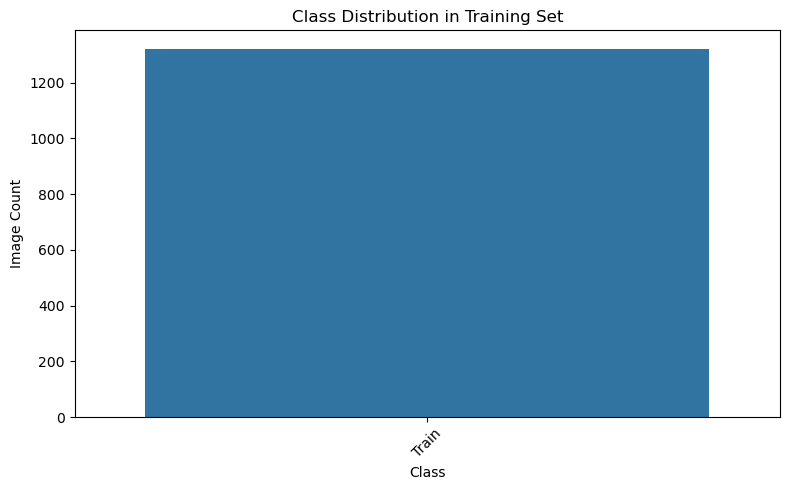

In [24]:
# Class distribution from train generator
labels, counts = np.unique(train_generator.classes, return_counts=True)
class_names = list(train_generator.class_indices.keys())

plt.figure(figsize=(8, 5))
sns.barplot(x=class_names, y=counts)
plt.title("Class Distribution in Training Set")
plt.xlabel("Class")
plt.ylabel("Image Count")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [29]:
num_classes = len([folder for folder in os.listdir(train_dir) if os.path.isdir(os.path.join(train_dir, folder))])
print("Number of classes:", num_classes)

Number of classes: 1


In [27]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, Dropout

input_img = Input(shape=(256, 256, 3))
x = Conv2D(32, (3, 3), activation='relu')(input_img)
x = MaxPooling2D(pool_size=(2, 2))(x)
x = Conv2D(64, (3, 3), activation='relu')(x)
x = MaxPooling2D(pool_size=(2, 2))(x)
x = Flatten()(x)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(num_classes, activation='softmax')(x)

plant_model_func = Model(inputs=input_img, outputs=output)
plant_model_func.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


In [28]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam

base_model = VGG16(include_top=False, weights='imagenet', input_shape=(256, 256, 3))
for layer in base_model.layers:
    layer.trainable = False  # Freeze pretrained layers

x = Flatten()(base_model.output)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(num_classes, activation='softmax')(x)

plant_model_vgg = Model(inputs=base_model.input, outputs=output)
plant_model_vgg.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


In [30]:
from tensorflow.keras.applications import ResNet50

base_model = ResNet50(include_top=False, weights='imagenet', input_shape=(256, 256, 3))
for layer in base_model.layers:
    layer.trainable = False

x = Flatten()(base_model.output)
x = Dense(256, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(num_classes, activation='softmax')(x)

plant_model_resnet = Model(inputs=base_model.input, outputs=output)
plant_model_resnet.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 8s 0us/step


In [31]:
history = plant_model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=10
)


Epoch 1/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 98s 2s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 2/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 97s 2s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 3/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 98s 2s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 4/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 99s 2s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 5/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 99s 2s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 6/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 98s 2s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 7/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 99s 2s/step - accuracy: 1.0000 - loss: 0.0000e+00 - val_accuracy: 1.0000 - val_loss: 0.0000e+00
Epoch 8/10
42/42 ━━━━━━━━━━━━━━━━━━━━ 99s 2s/step - accuracy: 

In [32]:
from tensorflow.keras.applications import MobileNetV2

base_model = MobileNetV2(include_top=False, weights='imagenet', input_shape=(256, 256, 3))
for layer in base_model.layers:
    layer.trainable = False

x = Flatten()(base_model.output)
x = Dense(128, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(num_classes, activation='softmax')(x)

plant_model_mobilenet = Model(inputs=base_model.input, outputs=output)
plant_model_mobilenet.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


C:\Users\sanje\AppData\Local\Temp\ipykernel_22188\928738566.py:3: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(include_top=False, weights='imagenet', input_shape=(256, 256, 3))


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [40]:
# Print all model summaries
print("Sequential Model Summary")
plant_model.summary()

print("\nFunctional Model Summary")
plant_model_func.summary()

print("\n VGG16 Model Summary")
plant_model_vgg.summary()

print("\nResNet50 Model Summary")
plant_model_resnet.summary()

print("\n MobileNet Model Summary")
plant_model_mobilenet.summary()

Sequential Model Summary


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 60, 60, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 30, 30, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 115200)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │    14,745,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 44,517,317 (169.82 MB)

 Trainable params: 14,839,105 (56.61 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 29,678,212 (113.21 MB)


Functional Model Summary


Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 246016)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │    31,490,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 31,509,697 (120.20 MB)

 Trainable params: 31,509,697 (120.20 MB)

 Non-trainable params: 0 (0.00 B)


 VGG16 Model Summary


Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 256, 256, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 256, 256, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 128, 128, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 128, 128, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 64, 64, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 64, 64, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 64, 64, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 32, 32, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 32, 32, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 32, 32, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 16, 16, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 16, 16, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 128)            │     4,194,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 18,909,249 (72.13 MB)

 Trainable params: 4,194,561 (16.00 MB)

 Non-trainable params: 14,714,688 (56.13 MB)


ResNet50 Model Summary


Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 262, 262,  │          0 │ input_layer_4[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 128, 128,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 128, 128,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 128, 128,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 130, 130,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 64, 64,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 64, 64,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 64, 64,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 64, 64,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 64, 64,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 64, 64,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 64, 64,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 64, 64,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 64, 64,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 64, 64,    │      1,024 │ conv2_block1_3_c

 Total params: 57,142,657 (217.98 MB)

 Trainable params: 33,554,945 (128.00 MB)

 Non-trainable params: 23,587,712 (89.98 MB)


 MobileNet Model Summary


Model: "functional_18"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 128, 128,  │        864 │ input_layer_5[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 128, 128,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 128, 128,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 128, 128,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 128, 128,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 128, 128,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 128, 128,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 128, 128,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 128, 128,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 128, 128,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 128, 128,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 129, 129,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 64, 64,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 64, 64,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 64, 64,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 64, 64,    │      2,304 │ block_1_depthwis

 Total params: 12,744,001 (48.61 MB)

 Trainable params: 10,486,017 (40.00 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [34]:
# Generate predictions
preds = plant_model.predict(test_generator)
y_pred = np.argmax(preds, axis=1)
y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

# Report
print(classification_report(y_true, y_pred, target_names=class_labels))

1/5 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step

c:\Users\sanje\anaconda3\Lib\site-packages\keras\src\ops\nn.py:944: UserWarning: You are using a softmax over axis -1 of a tensor of shape (32, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


5/5 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step
              precision    recall  f1-score   support

     Healthy       0.33      1.00      0.50        50
     Powdery       0.00      0.00      0.00        50
        Rust       0.00      0.00      0.00        50

    accuracy                           0.33       150
   macro avg       0.11      0.33      0.17       150
weighted avg       0.11      0.33      0.17       150



c:\Users\sanje\anaconda3\Lib\site-packages\keras\src\ops\nn.py:944: UserWarning: You are using a softmax over axis -1 of a tensor of shape (None, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(
c:\Users\sanje\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\sanje\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\sanje\anaconda3\Lib\site-packa

In [35]:
from sklearn.metrics import accuracy_score

In [36]:
# Nested test directory
outer_test_dir = r"C:\Users\sanje\Downloads\Datamining.ipynb\archive (4)\plant_disease_data\Test"
inner_test_dir = os.path.join(outer_test_dir, "Test")

# Check if inner Test exists
if os.path.exists(inner_test_dir):
    print(" Fixing nested 'Test/Test' structure...")

    # Move each subfolder (Healthy, Rust, etc.) up
    for class_folder in os.listdir(inner_test_dir):
        src = os.path.join(inner_test_dir, class_folder)
        dst = os.path.join(outer_test_dir, class_folder)

        if os.path.isdir(src):
            print(f" Moving folder: {src} → {dst}")
            shutil.move(src, dst)

    # Delete now-empty inner Test folder
    os.rmdir(inner_test_dir)
    print("Removed nested 'Test' folder.")

else:
    print(" No nested 'Test' folder found.")

# Count final images
print("\n Image Count Per Class After Fix:")
for class_folder in os.listdir(outer_test_dir):
    class_path = os.path.join(outer_test_dir, class_folder)
    if os.path.isdir(class_path):
        count = len([f for f in os.listdir(class_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))])
        print(f" {class_folder}: {count} image(s)")


 No nested 'Test' folder found.

 Image Count Per Class After Fix:
 Healthy: 50 image(s)
 Powdery: 50 image(s)
 Rust: 50 image(s)


In [37]:
plt.figure(figsize=(100, 50))

# Predict
preds = plant_model.predict(test_generator)
y_pred = np.argmax(preds, axis=1)
y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

# Per-class accuracy calculation
detailed_stats = []
for class_id, class_name in enumerate(class_labels):
    true_idx = np.where(y_true == class_id)[0]
    y_true_class = y_true[true_idx]
    y_pred_class = y_pred[true_idx]
    acc = accuracy_score(y_true_class, y_pred_class)
    detailed_stats.append({'Class': class_name, 'Accuracy': acc})

# Display DataFrame
stats_df = pd.DataFrame(detailed_stats)

print("\n Accuracy Breakdown per Class:")
print(" Darker color = Higher accuracy")
display(stats_df.style.format({'Accuracy': '{:.1%}'}).background_gradient(cmap='Blues'))

5/5 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step

 Accuracy Breakdown per Class:
 Darker color = Higher accuracy


,Class,Accuracy
0,Healthy,100.0%
1,Powdery,0.0%
2,Rust,0.0%


<Figure size 10000x5000 with 0 Axes>

In [38]:
train_dir = r"C:\Users\sanje\Downloads\Datamining.ipynb\archive (4)\plant_disease_data\Train"
class_counts = {}

# Count images per class
for class_folder in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_folder)
    if os.path.isdir(class_path):
        images = [f for f in os.listdir(class_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        count = len(images)
        class_counts[class_folder] = count
        print(f" {class_folder}: {count} image(s)")

print("\nFinal Class Counts:", class_counts)

# # Plot
# plt.figure(figsize=(10, 6))
# plt.bar(class_counts.keys(), class_counts.values(), color='skyblue')
# plt.title(" Training Image Count per Class")
# plt.xlabel("Class")
# plt.ylabel("Number of Images")
# plt.xticks(rotation=15)
# plt.grid(axis='y')
# plt.tight_layout()
# plt.show()


 Train: 0 image(s)

Final Class Counts: {'Train': 0}


In [41]:
class_labels = list(test_generator.class_indices.keys())


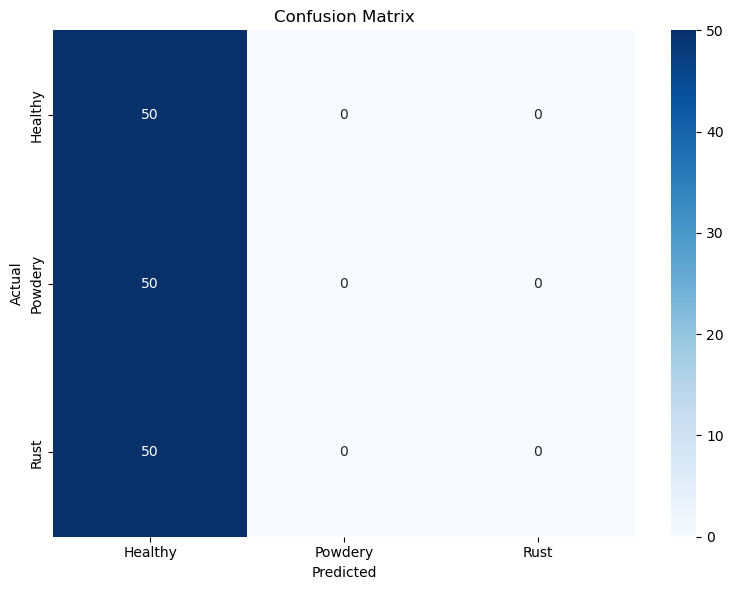

In [42]:
cm = confusion_matrix(y_true, y_pred)

# FIX: get real class names from generator
class_labels = list(test_generator.class_indices.keys())

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(pd.DataFrame(cm, index=class_labels, columns=class_labels),
            annot=True, cmap='Blues', fmt='g')
plt.title("Confusion Matrix")
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.tight_layout()
plt.show()


In [43]:
df = pd.DataFrame({
    "True Label": [class_labels[i] for i in y_true],
    "Predicted Label": [class_labels[i] for i in y_pred]
})
df.to_csv("plant_disease_predictions.csv", index=False)
print(" Saved predictions to CSV.")


 Saved predictions to CSV.


In [44]:
train_dir = r"C:\Users\sanje\Downloads\Datamining.ipynb\archive (4)\plant_disease_data\Train"

# 1. Define preprocessing
train_datagen = ImageDataGenerator(rescale=1./255)

# 2. Load training images
train_generator = train_datagen.flow_from_directory(
    directory=train_dir,
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical',  
    color_mode='rgb',
    shuffle=True
)

print(" Training data loaded successfully.")

Found 1322 images belonging to 1 classes.
 Training data loaded successfully.


In [46]:
val_dir = r"C:\Users\sanje\Downloads\Datamining.ipynb\archive (4)\plant_disease_data\Validation"
test_dir = r"C:\Users\sanje\Downloads\Datamining.ipynb\archive (4)\plant_disease_data\Test"  

val_datagen = ImageDataGenerator(rescale=1./255)
val_generator = val_datagen.flow_from_directory(
    directory=val_dir,
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=False
)

test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    directory=test_dir,  
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=False
)


Found 60 images belonging to 1 classes.
Found 150 images belonging to 3 classes.


In [47]:

# Get label maps
class_to_idx = test_generator.class_indices
idx_to_class = {v: k for k, v in class_to_idx.items()}
class_labels = [idx_to_class[i] for i in range(len(idx_to_class))]

# Predict across full test set
test_generator.reset()
preds_full = plant_model.predict(test_generator, verbose=1)
y_pred_full = np.argmax(preds_full, axis=1)
y_true_full = np.array(test_generator.classes)
filepaths_full = np.array(test_generator.filepaths)


c:\Users\sanje\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


5/5 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step


In [52]:
def show_class_samples(class_query, num_samples=16, randomize=True):
    # resolve class name 
    # exact (case-insensitive)
    matches = [name for name in class_to_idx if name.lower() == class_query.lower()]
    if not matches:
        # substring (case-insensitive)
        matches = [name for name in class_to_idx if class_query.lower() in name.lower()]
    if not matches:
        print(f"No class found matching '{class_query}'. Available: {list(class_to_idx.keys())}")
        return
    
    class_name = matches[0]
    class_id = class_to_idx[class_name]
    print(f"\nShowing samples for class: '{class_name}' (id {class_id})")

    #gather indices 
    idxs = np.where(y_true_full == class_id)[0]
    if len(idxs) == 0:
        print(f"No images in test set for class '{class_name}'.")
        return
    
    if randomize:
        import random
        idxs = random.sample(list(idxs), k=min(num_samples, len(idxs)))
    else:
        idxs = idxs[:num_samples]
    
    # load images 
    imgs = []
    y_true_sample = []
    y_pred_sample = []
    for i in idxs:
        img_path = filepaths_full[i]
        img = image.load_img(img_path, target_size=(img_height, img_width))
        img_arr = image.img_to_array(img) / 255.0
        imgs.append(img_arr)
        y_true_sample.append(y_true_full[i])
        y_pred_sample.append(y_pred_full[i])
    
    imgs = np.array(imgs)
    y_true_sample = np.array(y_true_sample)
    y_pred_sample = np.array(y_pred_sample)

    # grid size
    n = len(imgs)
    cols = min(8, n)  
    rows = ceil(n / cols)

    plt.figure(figsize=(cols * 2.5, rows * 2.5))
    print(f"\nSample Predictions (Green = Correct, Red = Wrong) - {n} image(s) from '{class_name}':\n")
    for i in range(n):
        ax = plt.subplot(rows, cols, i + 1)
        ax.imshow(imgs[i])
        ax.axis('off')
        true_label = idx_to_class[y_true_sample[i]]
        pred_label = idx_to_class[y_pred_sample[i]]
        color = 'green' if y_true_sample[i] == y_pred_sample[i] else 'red'
        ax.set_title(f"T:{true_label}\nP:{pred_label}", fontsize=8, color=color)
    plt.tight_layout()
    plt.show()


In [54]:
from tensorflow.keras.preprocessing import image
from math import ceil


{'Healthy': 0, 'Powdery': 1, 'Rust': 2}

Showing samples for class: 'Rust' (id 2)

Sample Predictions (Green = Correct, Red = Wrong) - 16 image(s) from 'Rust':



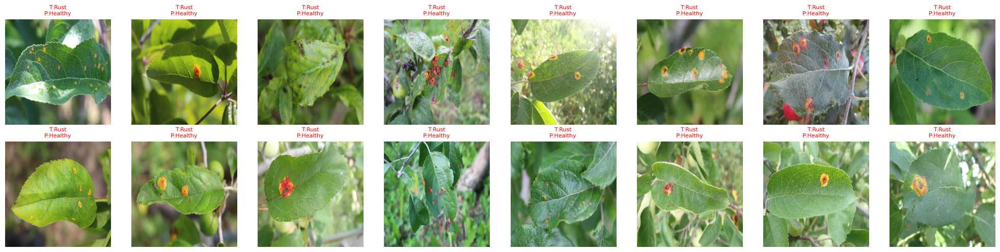


Showing samples for class: 'Powdery' (id 1)

Sample Predictions (Green = Correct, Red = Wrong) - 16 image(s) from 'Powdery':



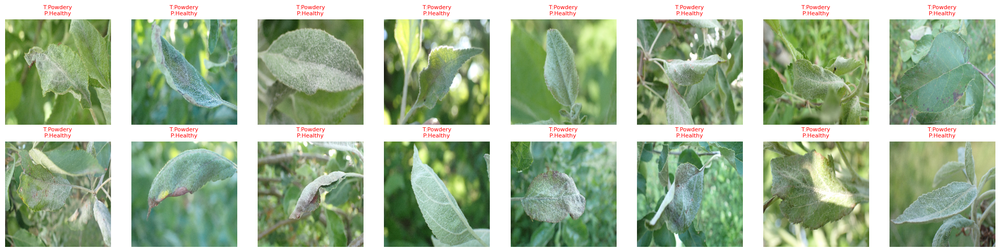

In [55]:
print(class_to_idx)  # inspect available class names

show_class_samples("rust",    num_samples=16)
show_class_samples("powder",  num_samples=16)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step


c:\Users\sanje\anaconda3\Lib\site-packages\keras\src\ops\nn.py:944: UserWarning: You are using a softmax over axis -1 of a tensor of shape (32, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(



 Sample Predictions (Green = Correct, Red = Wrong):



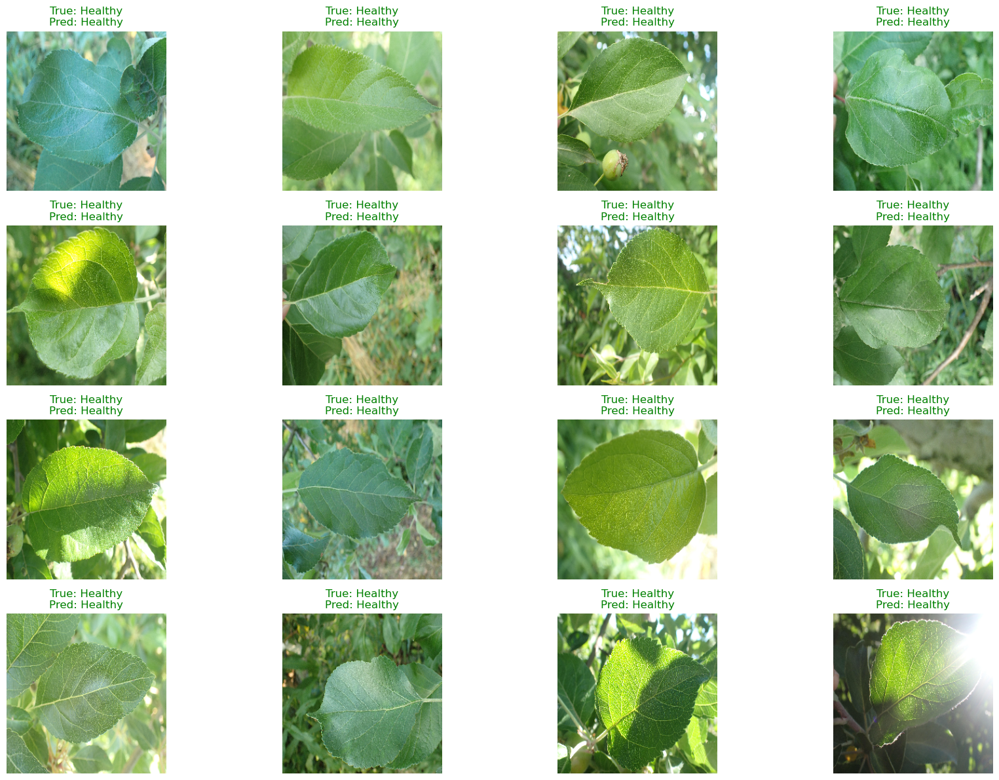

In [56]:
# Load class names again if needed
class_labels = list(test_generator.class_indices.keys())

# Reset generator
test_generator.reset()

# Get a batch of images and predictions
images, labels = next(test_generator)
preds = plant_model.predict(images)
y_pred = np.argmax(preds, axis=1)
y_true = np.argmax(labels, axis=1)

# Plot sample predictions
print("\n Sample Predictions (Green = Correct, Red = Wrong):\n")
plt.figure(figsize=(18, 12))  # Bigger figure for 16 images
for i in range(16):  # Plot 16 images
    ax = plt.subplot(4, 4, i + 1)  # 4x4 grid
    ax.imshow(images[i])
    ax.axis('off')
    true_label = class_labels[y_true[i]]
    pred_label = class_labels[y_pred[i]]
    color = 'green' if y_true[i] == y_pred[i] else 'red'
    ax.set_title(f'True: {true_label}\nPred: {pred_label}', color=color)

plt.tight_layout()
plt.show()


5/5 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step

 Sample Predictions (Green = Correct, Red = Wrong) - Showing 32 images:



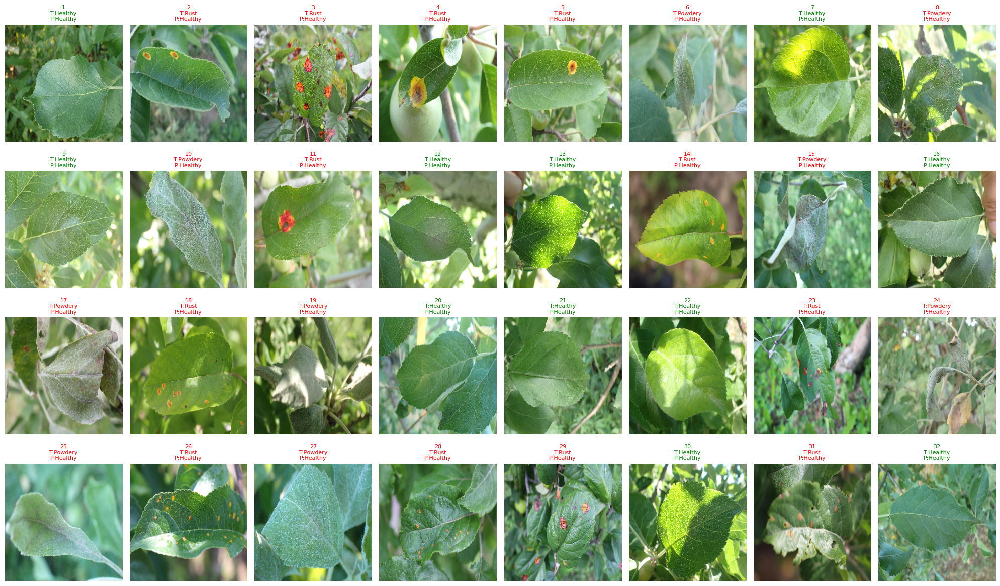

In [58]:
import random

# Number of images to display
num_samples = 32
rows, cols = 4, 8

# Reset generator
test_generator.reset()

# Predict on full test set
preds = plant_model.predict(test_generator, verbose=1)
y_pred = np.argmax(preds, axis=1)
y_true = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

# Get filepaths
filenames = test_generator.filepaths

# Random sample indices from entire test set
sample_indices = random.sample(range(len(filenames)), num_samples)

# Load images and true/pred labels
images = []
true_labels = []
pred_labels = []

for idx in sample_indices:
    img_path = filenames[idx]
    img = image.load_img(img_path, target_size=(img_height, img_width))
    img_array = image.img_to_array(img) / 255.0
    images.append(img_array)

    true_labels.append(y_true[idx])
    pred_labels.append(y_pred[idx])

# Convert to numpy arrays
images = np.array(images)
y_true_sample = np.array(true_labels)
y_pred_sample = np.array(pred_labels)

# Plot predictions
print(f"\n Sample Predictions (Green = Correct, Red = Wrong) - Showing {num_samples} images:\n")
plt.figure(figsize=(20, 12))  # Adjust figure size based on number
for i in range(num_samples):
    ax = plt.subplot(rows, cols, i + 1)
    ax.imshow(images[i])
    ax.axis('off')
    true_label = class_labels[y_true_sample[i]]
    pred_label = class_labels[y_pred_sample[i]]
    color = 'green' if y_true_sample[i] == y_pred_sample[i] else 'red'
    ax.set_title(f'{i+1}\nT:{true_label}\nP:{pred_label}', fontsize=8, color=color)

plt.tight_layout()
plt.show()

c:\Users\sanje\anaconda3\Lib\site-packages\keras\src\ops\nn.py:944: UserWarning: You are using a softmax over axis -1 of a tensor of shape (32, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


5/5 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step


c:\Users\sanje\anaconda3\Lib\site-packages\keras\src\ops\nn.py:944: UserWarning: You are using a softmax over axis -1 of a tensor of shape (None, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(
c:\Users\sanje\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\sanje\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\sanje\anaconda3\Lib\site-packa

              precision    recall  f1-score   support

     Healthy       0.33      1.00      0.50        50
     Powdery       0.00      0.00      0.00        50
        Rust       0.00      0.00      0.00        50

    accuracy                           0.33       150
   macro avg       0.11      0.33      0.17       150
weighted avg       0.11      0.33      0.17       150



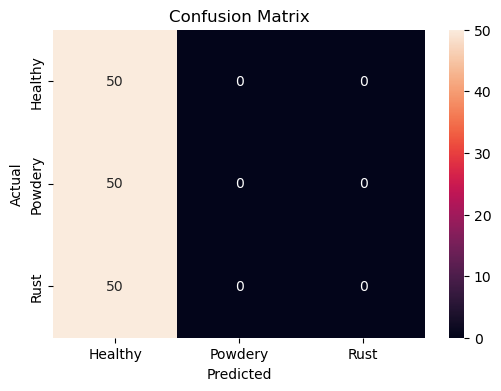

In [65]:
# Predict test images
preds = model.predict(test_generator)
y_pred = np.argmax(preds, axis=1)
y_true = test_generator.classes
class_names = list(test_generator.class_indices.keys())

# Classification report
print(classification_report(y_true, y_pred, target_names=class_names))

# Confusion matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt="d", xticklabels=class_names, yticklabels=class_names)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()